# Post Test set

In [1]:
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
df = pd.DataFrame()
df_2 = pd.DataFrame()

## Test Metrics

### Original volume

#### First Eigen Component percentage

In [3]:
from scripts.utils import *
orig_path = 'data/MOLLI_post_dataset/test'
orig_pca_changes = []
for file in sorted(glob.glob(os.path.join(orig_path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    orig_pca_changes.append(org_dis)
print(f"Mean of original PCA is {np.mean(np.array(orig_pca_changes))}")

Mean of original PCA is 0.9112564668808243


#### T1 fitting

In [4]:
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import ndimage

title_font_size=8
title_pad = 10
VMAX = 250

TVMAX = 1000

def mae(a, b):
    return np.absolute(np.subtract(a, b)).mean()


def plot_t1_changes(path, size=(20, 50)):
    fig = plt.figure(figsize=size)
    t1err_square_list = []
    t1err_heart_list = []
    t1err_myo_list = []
    subject_list = []
    sd_square_list = []
    sd_heart_list = []
    sd_myo_list = []
    
    neighbor = ndimage.generate_binary_structure(2, 2)
    for i, file in enumerate(sorted(glob.glob(os.path.join(path, '*.mat')))):
        subject = Path(file).stem
        subject_list.append(subject)
        fd = scipy.io.loadmat(file)

        SD_err = np.real(fd['sd_mse'])

        epi = fd['epi_BW']
        endo = fd['endo_BW']

        heartmask = ndimage.binary_dilation(epi, structure=neighbor, iterations=1).astype(epi.dtype)

        itemindex = np.where(heartmask == 1)
        x1, x2 = max(itemindex[0][0]-20,0), min(itemindex[0][-1]+20, 111)
        y1, y2 = max(itemindex[1][0]-40,0), min(itemindex[1][-1]+40, 111)
        # print(subject, x1, x2, y1, y2)
        areamask = np.zeros_like(heartmask)
        areamask[x1:x2, y1:y2] = 1
        myomask = heartmask - endo
        
        errmap = SD_err * areamask
        square_SD_err = np.mean(errmap[areamask==1])
        t1err_square_list.append(square_SD_err)
        
        fig.add_subplot(20, 6, 1+i*6)
        ax = plt.gca()
        im = ax.imshow(errmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(square_SD_err):.4f}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        t1_params_pre = fd['pmap_mse']
        a = t1_params_pre[:, :, 0]
        b = t1_params_pre[:, :, 1]
        c = t1_params_pre[:, :, 2]
        t1map = c * (b - 1)
        t1map[t1map<0] = 0
        t1map[t1map>TVMAX] = TVMAX
        sd_square_list.append(t1map*areamask)

        fig.add_subplot(20, 6, 2+i*6)
        ax = plt.gca()
        im = ax.imshow(t1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        hearterrmap = SD_err * heartmask
        heartt1map = t1map * heartmask
        heart_SD_err = np.mean(hearterrmap[heartmask==1])
        t1err_heart_list.append(heart_SD_err)
        sd_heart_list.append(heartt1map)

        fig.add_subplot(20, 6, 3+i*6)
        ax = plt.gca()
        im = ax.imshow(hearterrmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(heart_SD_err):.4f} in ROI", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(20, 6, 4+i*6)
        ax = plt.gca()
        im = ax.imshow(heartt1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        myoerrmap = SD_err * myomask
        myot1map = t1map * myomask
        myo_SD_err = np.mean(myoerrmap[myomask==1])
        sd_myo_list.append(myot1map)
        t1err_myo_list.append(myo_SD_err)

        fig.add_subplot(20, 6, 5+i*6)
        ax = plt.gca()
        im = ax.imshow(myoerrmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(myo_SD_err):.4f} in Myocardium", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(20, 6, 6+i*6)
        ax = plt.gca()
        im = ax.imshow(myot1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    plt.subplots_adjust(left=0.0001,right=0.9, top=0.95, bottom=0.1,)
    return fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list

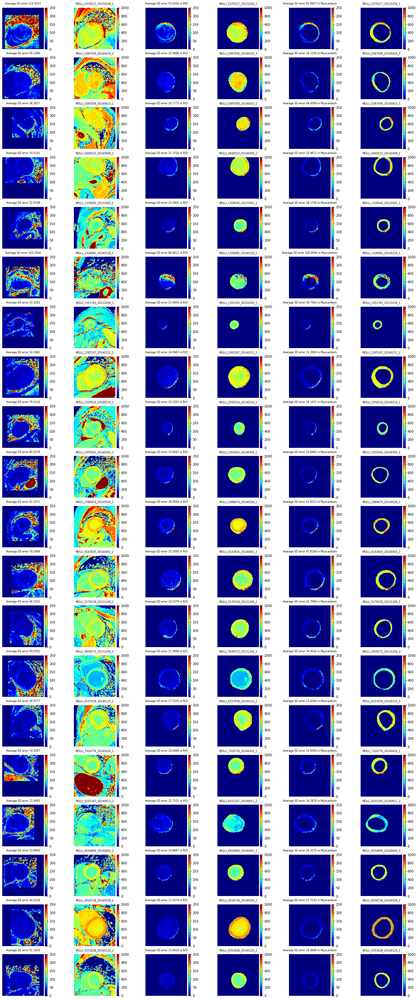

In [5]:
path = "data/MOLLI_post_dataset/T1_SDerr"

fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list, orig_t1err_myo_list, orig_sd_square_list, orig_sd_heart_list, orig_sd_myo_list = plot_t1_changes(path)
plt.savefig(f"data/MOLLI_post_dataset/T1_SDerr/orig_t1err.png", dpi=300)

df['Cases'] = subject_list
df['Raw Square T1err'] = orig_t1err_square_list
df['Raw ROI T1err'] = orig_t1err_heart_list
df['Raw Myo T1err'] = orig_t1err_myo_list
df_2['Cases'] = subject_list
df_2['Raw PCA'] = orig_pca_changes

### Round 1

In [6]:
import voxelmorph_group as vxm  # nopep8
import numpy as np
import glob
import os
jacobian = vxm.losses.Jacobian().loss

In [7]:
r = 1
root = f"results/MOLLI_pre/Group/rank_5_5_5_5_5_5_5/nmi/smooth/image_loss_weight1/cycle_loss_weight0.01/weight0.001/bspline/cps4_svfsteps7_svfscale1/e100/test_MOLLI_post"
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [8]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 1 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 1 PCA is 0.917120881125568 and std is 0.037030942240325035


#### Jacobian Determination

In [9]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0034369404893368483


#### T1 fitting

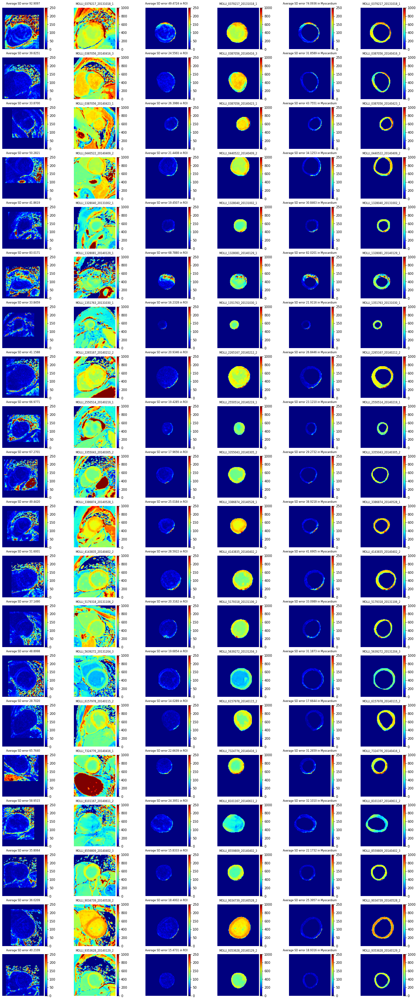

In [10]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

### Round 2

In [11]:
r = 2
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [12]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9212522400007727 and std is 0.035522943236673626


#### Jacobian Determination

In [13]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0033507905900478363


#### T1 fitting

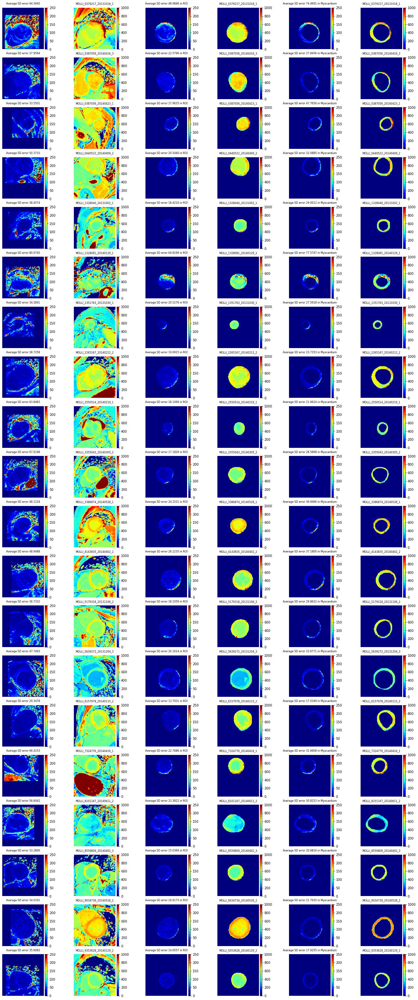

In [14]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

### Round 3

In [15]:
r = 3
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [16]:
path = f"{base_path}/moved"
r5_pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    r5_pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(r5_pca_changes))} and std is {np.std(np.array(r5_pca_changes))}")

Mean of Round 2 PCA is 0.9241873343894019 and std is 0.033521633197215565


#### Jacobian Determination

In [17]:
r5_folding_ratio_list = []
r5_mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    r5_folding_ratio_list.append(folding_ratio)
    r5_mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(r5_folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(r5_mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0038032550364732742


#### T1 fitting

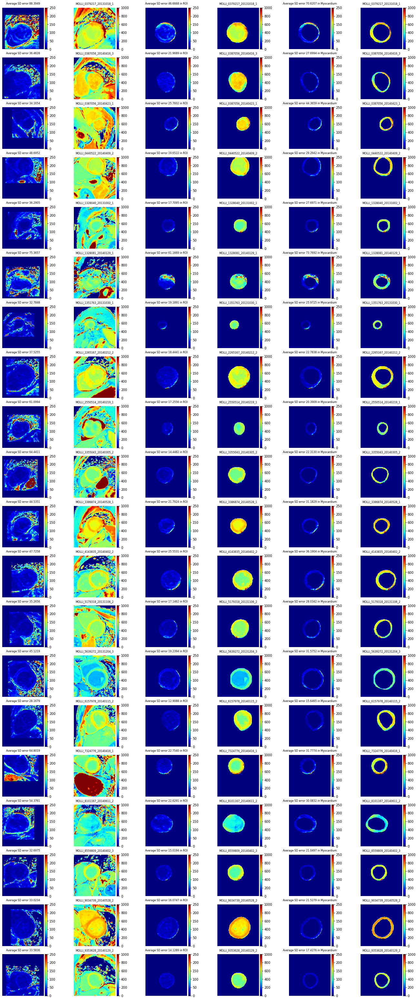

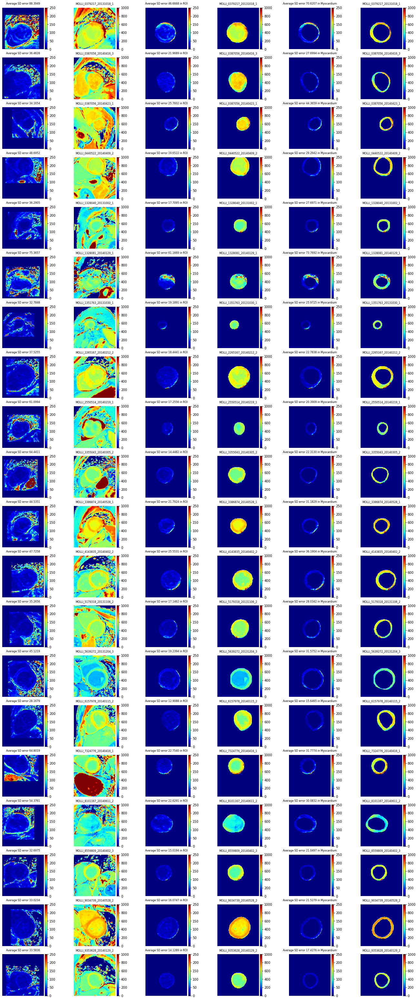

In [18]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

### Round 4

In [19]:
r = 4
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [20]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9258664111708674 and std is 0.03225119455340531


#### Jacobian Determination

In [21]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004067800007760525


#### T1 fitting

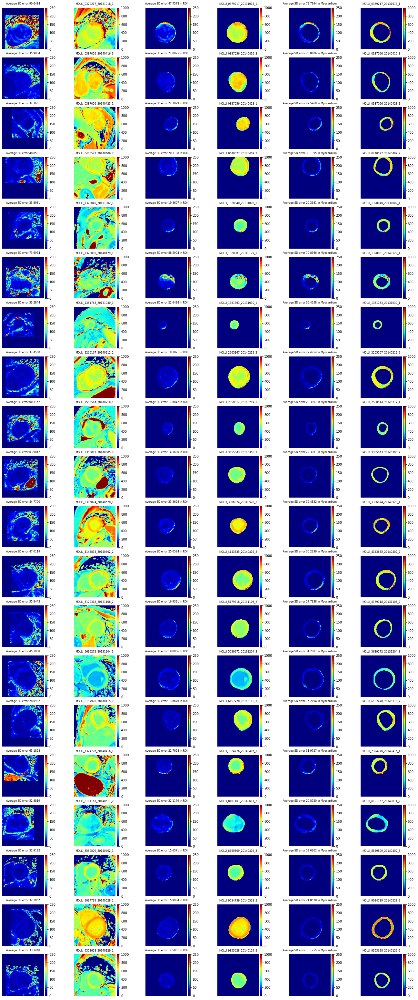

In [22]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

### Round 5

In [23]:
r = 5
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [24]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9268241181456247 and std is 0.031200578437242464


#### Jacobian Determination

In [25]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004162787459790707


#### T1 fitting

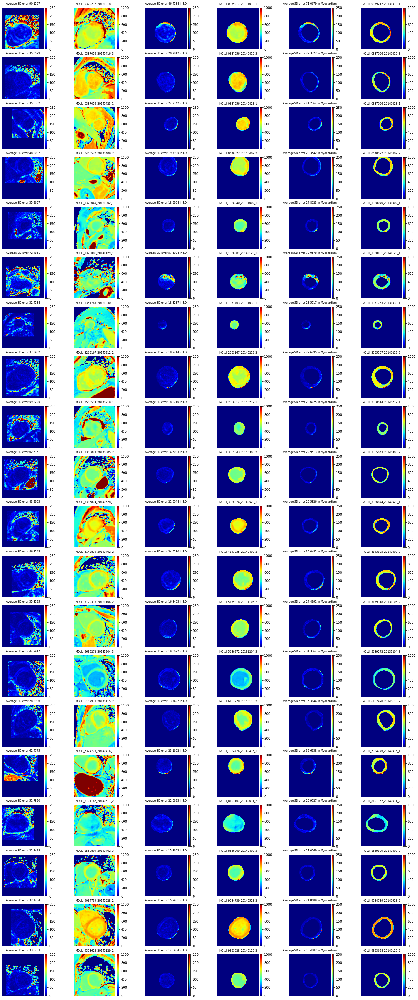

In [26]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

### Round 6

In [27]:
r = 6
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [28]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9275109443666402 and std is 0.030266965756106188


#### Jacobian Determination

In [29]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004761549178510904


#### T1 fitting

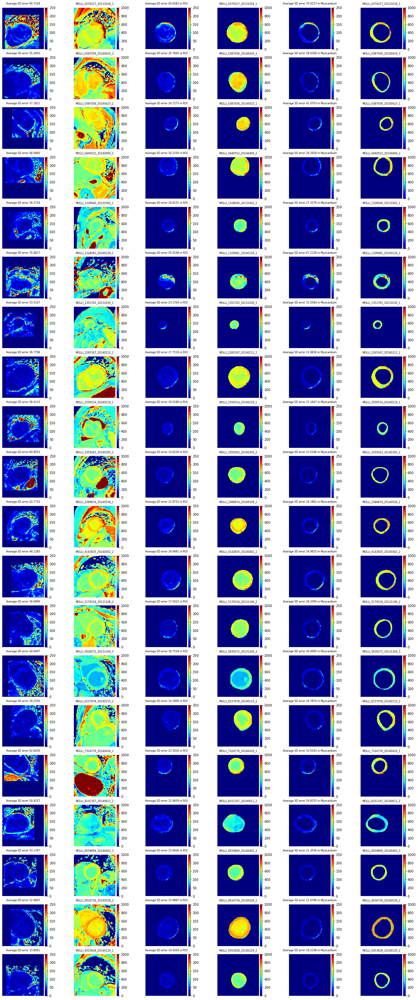

In [30]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

### Round 7

In [31]:
r = 7
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [32]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9278151797702575 and std is 0.02944643789859881


#### Jacobian Determination

In [33]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004941688850522041


#### T1 fitting

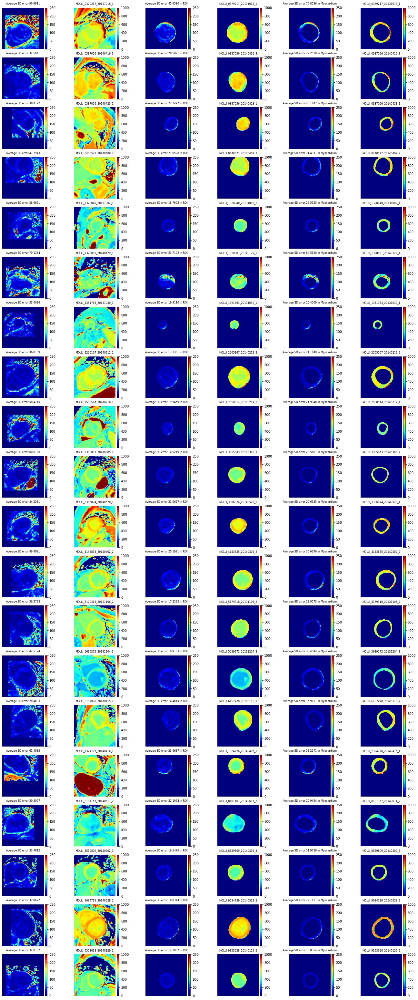

In [34]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

### Summary

In [35]:
df
df.to_csv(f"{root}/summary.csv")

In [36]:
df_ROI_desc = pd.DataFrame()
df_ROI_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_ROI_desc[f'R{round}/Raw ROI %'] = (df['Raw ROI T1err'] - df[f'R{round} ROI T1err']) / df['Raw ROI T1err']
df_ROI_desc.describe()

,R1/Raw ROI %,R2/Raw ROI %,R3/Raw ROI %,R4/Raw ROI %,R5/Raw ROI %,R6/Raw ROI %,R7/Raw ROI %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.104479,0.132549,0.175597,0.161477,0.177860,0.163787,0.165825
std,0.076478,0.073396,0.074931,0.086246,0.076628,0.096336,0.089938
min,-0.055819,0.038759,0.071075,-0.031816,0.054244,-0.055812,0.014954
25%,0.053232,0.069398,0.115714,0.107114,0.113083,0.090072,0.099292
50%,0.091717,0.117703,0.152088,0.166316,0.184495,0.171063,0.162922
75%,0.155781,0.201453,0.245220,0.222212,0.236657,0.235984,0.230077
max,0.260313,0.262123,0.301234,0.309675,0.313703,0.315514,0.336482


In [37]:
df_Myo_desc = pd.DataFrame()
df_Myo_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_Myo_desc[f'R{round}/Raw Myo %'] = (df['Raw Myo T1err'] - df[f'R{round} Myo T1err']) / df['Raw Myo T1err']
df_Myo_desc.describe()

,R1/Raw Myo %,R2/Raw Myo %,R3/Raw Myo %,R4/Raw Myo %,R5/Raw Myo %,R6/Raw Myo %,R7/Raw Myo %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.120141,0.151378,0.199782,0.187601,0.207312,0.193646,0.196624
std,0.104078,0.092606,0.099768,0.109423,0.104135,0.115855,0.112151
min,-0.169057,-0.003232,0.008994,-0.006193,-0.003942,-0.010515,-0.019236
25%,0.075604,0.085551,0.119783,0.112155,0.142629,0.125649,0.138793
50%,0.121928,0.158513,0.204228,0.217274,0.223553,0.182028,0.173064
75%,0.185132,0.230433,0.275764,0.267655,0.287256,0.287753,0.304220
max,0.287110,0.300739,0.343566,0.350600,0.357499,0.339452,0.357012


In [38]:
df_ROI_MAE = pd.DataFrame()
df_ROI_MAE['Cases'] = df['Cases']
rounds = 7
for round in range(1, rounds+1):
    df_ROI_MAE[f'R{round}'] = df[f"R{round} ROI T1 MAE"]
df_ROI_MAE.describe()

,R1,R2,R3,R4,R5,R6,R7
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,1.567858,2.217475,2.468872,2.824706,3.112144,3.418508,3.783470
std,0.703284,0.978331,1.182927,1.304981,1.387817,1.551944,1.660727
min,0.450664,0.807542,0.904657,1.169672,1.148504,1.271845,1.404751
25%,1.071787,1.660680,1.755623,1.953202,2.165585,2.310912,2.617075
50%,1.414351,2.010430,2.351814,2.803856,3.051016,3.322509,3.764652
75%,1.793232,2.673383,2.988455,3.421332,3.788022,4.170187,4.432030
max,3.310439,5.237086,6.257736,6.852207,7.140215,8.046905,8.768374


In [39]:
df_Myo_MAE = pd.DataFrame()
df_Myo_MAE['Cases'] = df['Cases']
for round in range(1, rounds+1):
    df_Myo_MAE[f'R{round}'] = df[f"R{round} Myo T1 MAE"]
df_Myo_MAE.describe()

,R1,R2,R3,R4,R5,R6,R7
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,1.168065,1.664302,1.807184,2.020313,2.191182,2.385434,2.637402
std,0.575981,0.796822,0.922869,1.001054,1.023417,1.137872,1.206065
min,0.297669,0.537481,0.589844,0.764097,0.917735,1.024082,1.158199
25%,0.820461,1.215194,1.235355,1.378621,1.529382,1.627588,1.825897
50%,0.971825,1.473555,1.714447,1.931513,2.188961,2.290297,2.559141
75%,1.341135,1.865637,2.113198,2.421123,2.540349,2.739424,3.246076
max,2.835995,4.222081,5.014382,5.394959,5.542547,6.205429,6.639419


In [40]:
df_PCA_desc = pd.DataFrame()
df_PCA_desc['Cases'] = df_2['Cases']
for round  in range(1, 8):
    df_PCA_desc[f'R{round}/Raw PCA %'] = (df_2[f'R{round} PCA'] - df_2['Raw PCA']) / df_2['Raw PCA']
df_PCA_desc.describe()

,R1/Raw PCA %,R2/Raw PCA %,R3/Raw PCA %,R4/Raw PCA %,R5/Raw PCA %,R6/Raw PCA %,R7/Raw PCA %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.006584,0.011214,0.011214,0.016475,0.017591,0.018406,0.018795
std,0.005752,0.008967,0.008967,0.013643,0.015273,0.016895,0.018409
min,-0.000992,0.001420,0.001420,0.001924,0.000919,0.000638,-0.000333
25%,0.002880,0.004899,0.004899,0.006588,0.006843,0.007418,0.007630
50%,0.005582,0.009490,0.009490,0.013376,0.013815,0.013597,0.013491
75%,0.008223,0.013328,0.013328,0.019878,0.021592,0.022609,0.023533
max,0.021488,0.033210,0.033210,0.057133,0.063431,0.070616,0.076204


In [41]:
df_det = df_2[['R1 Det', 'R2 Det', 'R3 Det', 'R4 Det', 'R5 Det', 'R6 Det', 'R7 Det']]
df_det.describe()

,R1 Det,R2 Det,R3 Det,R4 Det,R5 Det,R6 Det,R7 Det
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.003437,0.003351,0.003351,0.004068,0.004163,0.004762,0.004942
std,0.000408,0.000236,0.000236,0.000277,0.000272,0.000279,0.000374
min,0.002844,0.003013,0.003013,0.003519,0.003682,0.004268,0.004293
25%,0.003060,0.003164,0.003164,0.003884,0.003948,0.004568,0.004646
50%,0.003491,0.003342,0.003342,0.004116,0.004198,0.004765,0.004983
75%,0.003631,0.003512,0.003512,0.004226,0.004318,0.004917,0.005177
max,0.004309,0.003848,0.003848,0.004594,0.004753,0.005329,0.005621
